In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm

import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.optimize import curve_fit


In [2]:
prices2 = pd.read_csv("/Users/andaks/Downloads/round-5-island-data-bottle/prices_round_5_day_2.csv", sep = ";")
prices3 = pd.read_csv("/Users/andaks/Downloads/round-5-island-data-bottle/prices_round_5_day_3.csv", sep = ";")
prices4 = pd.read_csv("/Users/andaks/Downloads/round-5-island-data-bottle/prices_round_5_day_4.csv", sep = ";")
trades2 = pd.read_csv("/Users/andaks/Downloads/round-5-island-data-bottle/trades_round_5_day_2.csv",sep = ";")
trades3 = pd.read_csv("/Users/andaks/Downloads/round-5-island-data-bottle/trades_round_5_day_3.csv",sep = ";")
trades4 = pd.read_csv("/Users/andaks/Downloads/round-5-island-data-bottle/trades_round_5_day_4.csv",sep = ";")
prices2["day"] = 2
prices3["day"] = 3
prices4["day"] = 4
prices = pd.concat([prices2,prices3,prices4],ignore_index=True)
prices.reset_index(inplace = True)
trades2["day"] = 2
trades3["day"] = 3
trades4["day"] = 4
trades = pd.concat([trades2,trades3,trades4],ignore_index=True)
trades.reset_index(inplace = True)
#prices.loc[prices["day"] == 3, "timestamp"] += 1000000
#prices.loc[prices["day"] == 4, "timestamp"] += 2000000
#trades.loc[trades["day"] == 3, "timestamp"] += 1000000
#trades.loc[trades["day"] == 4, "timestamp"] += 2000000


In [3]:
prices = prices[prices['product'].str.contains('VOLCANIC_ROCK', na=False)]

In [4]:
trades = trades[trades['symbol'].str.contains('VOLCANIC_ROCK', na=False)]

In [5]:
vol_rock = prices

In [6]:
vol_rock.head(5)

,index,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,ask_price_1,ask_volume_1,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss
1,1,2,0,VOLCANIC_ROCK_VOUCHER_9750,469.0,11.0,NaN,NaN,NaN,NaN,470.0,11.0,NaN,NaN,NaN,NaN,469.5,0.0
3,3,2,0,VOLCANIC_ROCK_VOUCHER_9500,718.0,11.0,NaN,NaN,NaN,NaN,719.0,11.0,NaN,NaN,NaN,NaN,718.5,0.0
4,4,2,0,VOLCANIC_ROCK,10218.0,150.0,10217.0,64.0,NaN,NaN,10219.0,150.0,10220.0,64.0,NaN,NaN,10218.5,0.0
6,6,2,0,VOLCANIC_ROCK_VOUCHER_10250,63.0,11.0,NaN,NaN,NaN,NaN,64.0,11.0,NaN,NaN,NaN,NaN,63.5,0.0
12,12,2,0,VOLCANIC_ROCK_VOUCHER_10000,233.0,11.0,NaN,NaN,NaN,NaN,234.0,11.0,NaN,NaN,NaN,NaN,233.5,0.0


In [7]:
vol_rock['V'] = (vol_rock['bid_price_1'] + vol_rock['ask_price_1']) / 2

In [8]:
vol_rock['actual_time'] = vol_rock['day'] * 1000000 + vol_rock['timestamp']

In [9]:
vol_rock['tte'] = 7000000 - vol_rock['actual_time']

In [10]:
vol_rock.head(2)

,index,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,...,ask_volume_1,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss,V,actual_time,tte
1,1,2,0,VOLCANIC_ROCK_VOUCHER_9750,469.0,11.0,NaN,NaN,NaN,NaN,...,11.0,NaN,NaN,NaN,NaN,469.5,0.0,469.5,2000000,5000000
3,3,2,0,VOLCANIC_ROCK_VOUCHER_9500,718.0,11.0,NaN,NaN,NaN,NaN,...,11.0,NaN,NaN,NaN,NaN,718.5,0.0,718.5,2000000,5000000


In [11]:
vol_rock['tte_part'] = vol_rock['tte'] / 7000000

In [12]:
volcanic_rock_df = vol_rock[vol_rock['product'] == 'VOLCANIC_ROCK']

option_rock = vol_rock[vol_rock['product'].str.contains('VOLCANIC_ROCK_VOUCHER_')]

In [13]:
volcanic_rock_df

,index,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,...,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss,V,actual_time,tte,tte_part
4,4,2,0,VOLCANIC_ROCK,10218.0,150.0,10217.0,64.0,NaN,NaN,...,10220.0,64.0,NaN,NaN,10218.5,0.0,10218.5,2000000,5000000,0.714286
16,16,2,100,VOLCANIC_ROCK,10217.0,106.0,10216.0,44.0,NaN,NaN,...,10219.0,44.0,NaN,NaN,10217.5,0.0,10217.5,2000100,4999900,0.714271
37,37,2,200,VOLCANIC_ROCK,10221.0,136.0,10220.0,55.0,NaN,NaN,...,NaN,NaN,NaN,NaN,10222.0,0.0,10222.0,2000200,4999800,0.714257
56,56,2,300,VOLCANIC_ROCK,10222.0,168.0,NaN,NaN,NaN,NaN,...,10225.0,61.0,NaN,NaN,10223.0,0.0,10223.0,2000300,4999700,0.714243
60,60,2,400,VOLCANIC_ROCK,10216.0,181.0,NaN,NaN,NaN,NaN,...,10219.0,54.0,NaN,NaN,10217.0,0.0,10217.0,2000400,4999600,0.714229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
449932,449932,4,999500,VOLCANIC_ROCK,10104.0,193.0,NaN,NaN,NaN,NaN,...,10107.0,51.0,NaN,NaN,10105.0,0.0,10105.0,4999500,2000500,0.285786
449949,449949,4,999600,VOLCANIC_ROCK,10105.0,131.0,10104.0,74.0,NaN,NaN,...,NaN,NaN,NaN,NaN,10106.0,0.0,10106.0,4999600,2000400,0.285771
449956,449956,4,999700,VOLCANIC_ROCK,10106.0,123.0,10105.0,56.0,NaN,NaN,...,10108.0,56.0,NaN,NaN,10106.5,0.0,10106.5,4999700,2000300,0.285757
449977,449977,4,999800,VOLCANIC_ROCK,10104.0,113.0,10103.0,73.0,NaN,NaN,...,NaN,NaN,NaN,NaN,10105.0,0.0,10105.0,4999800,2000200,0.285743


In [14]:
option_rock.head(5)

,index,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,...,ask_price_2,ask_volume_2,ask_price_3,ask_volume_3,mid_price,profit_and_loss,V,actual_time,tte,tte_part
1,1,2,0,VOLCANIC_ROCK_VOUCHER_9750,469.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,469.5,0.0,469.5,2000000,5000000,0.714286
3,3,2,0,VOLCANIC_ROCK_VOUCHER_9500,718.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,718.5,0.0,718.5,2000000,5000000,0.714286
6,6,2,0,VOLCANIC_ROCK_VOUCHER_10250,63.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,63.5,0.0,63.5,2000000,5000000,0.714286
12,12,2,0,VOLCANIC_ROCK_VOUCHER_10000,233.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,233.5,0.0,233.5,2000000,5000000,0.714286
13,13,2,0,VOLCANIC_ROCK_VOUCHER_10500,8.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,8.5,0.0,8.5,2000000,5000000,0.714286


In [15]:
# Merge option_rock with volcanic_rock_df on tte_part to get the mid_price as S
option_rock = option_rock.merge(
    volcanic_rock_df[['tte_part', 'mid_price']],
    on='tte_part',
    how='left'
)

# Rename the mid_price column to S
option_rock.rename(columns={'mid_price_y': 'S'}, inplace=True)

In [16]:
option_rock.head(5)

,index,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,...,ask_volume_2,ask_price_3,ask_volume_3,mid_price_x,profit_and_loss,V,actual_time,tte,tte_part,S
0,1,2,0,VOLCANIC_ROCK_VOUCHER_9750,469.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,469.5,0.0,469.5,2000000,5000000,0.714286,10218.5
1,3,2,0,VOLCANIC_ROCK_VOUCHER_9500,718.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,718.5,0.0,718.5,2000000,5000000,0.714286,10218.5
2,6,2,0,VOLCANIC_ROCK_VOUCHER_10250,63.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,63.5,0.0,63.5,2000000,5000000,0.714286,10218.5
3,12,2,0,VOLCANIC_ROCK_VOUCHER_10000,233.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,233.5,0.0,233.5,2000000,5000000,0.714286,10218.5
4,13,2,0,VOLCANIC_ROCK_VOUCHER_10500,8.0,11.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,8.5,0.0,8.5,2000000,5000000,0.714286,10218.5


In [17]:
option_rock.drop(columns=['mid_price_x'], inplace=True)

In [18]:
# Extract strike price K from the product column
def extract_strike(product):
    return int(product.split("_")[-1])

option_rock['K'] = option_rock['product'].apply(extract_strike)

In [19]:
# Compute m_t
option_rock['m_t'] = np.log(option_rock['K'] / option_rock['S']) / np.sqrt(option_rock['tte_part'])

In [20]:
def black_scholes_call(S, K, T, r, sigma):
    """
    Calculate the price of a European call option using Black-Scholes formula.
    
    Parameters:
    S: Underlying asset price
    K: Strike price
    T: Time to expiration (in years)
    r: Risk-free interest rate (annual rate, expressed as a decimal)
    sigma: Volatility of the underlying asset (annual, expressed as a decimal)
    
    Returns:
    Call option price
    """
    if T <= 0:
        # For expired options, return max(0, S-K)
        return max(0, S-K)
    
    if sigma <= 0:
        # Handle invalid volatility
        return max(0, S-K * np.exp(-r*T))
    
    d1 = (np.log(S/K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    
    return S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)

def implied_volatility_newton(S, V, K, T, r=0.0, initial_guess=0.3, 
                             precision=1e-8, max_iterations=100):
    """
    Calculate implied volatility using Newton-Raphson method.
    
    Parameters:
    S: Underlying asset price
    V: Observed call option price
    K: Strike price
    T: Time to expiration (in years)
    r: Risk-free interest rate (default: 0.0)
    initial_guess: Initial guess for volatility (default: 0.3)
    precision: Desired precision (default: 1e-8)
    max_iterations: Maximum number of iterations (default: 100)
    
    Returns:
    Implied volatility (sigma)
    """
    # Basic error checking
    if V <= 0:
        return 0  # Option has no value
    
    if V >= S:
        return float('inf')  # Option price exceeds underlying value
    
    intrinsic = max(0, S - K * np.exp(-r * T))
    if V < intrinsic:
        return 0  # Option price below intrinsic value
    
    if T <= 0:
        return float('nan')  # Expired option
    
    # Initial guess
    sigma = initial_guess
    
    # Calculate vega (derivative of price with respect to volatility)
    def vega(sigma):
        d1 = (np.log(S/K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
        return S * np.sqrt(T) * norm.pdf(d1)
    
    for i in range(max_iterations):
        price = black_scholes_call(S, K, T, r, sigma)
        price_diff = price - V
        
        if abs(price_diff) < precision:
            return sigma
        
        v = vega(sigma)
        if abs(v) < 1e-10:
            # Avoid division by zero
            return float('nan')
        
        # Newton-Raphson update
        sigma = sigma - price_diff / v
        
        # Handle sigma going negative or too high
        if sigma <= 0:
            sigma = 0.001
        elif sigma > 50:
            return float('nan')
    
    # If didn't converge within max iterations
    return float('nan')

def calculate_implied_vol_for_dataframe(df):
    """
    Calculate implied volatility for each row in the dataframe and add to 'v' column.
    
    Parameters:
    df: DataFrame with columns 'S' (underlying price), 'V' (option price), 
        'K' (strike price), and 'tte_part' (time to expiration)
    
    Returns:
    DataFrame with added 'v' column containing the implied volatility
    """
    # Create a copy of the dataframe to avoid modifying the original
    result_df = df.copy()
    
    # Add empty column for implied volatility
    result_df['v'] = np.nan
    
    # Counter for progress tracking
    total_rows = len(result_df)
    processed = 0
    error_count = 0
    
    # Process each row
    for idx, row in result_df.iterrows():
        try:
            # Extract values from row
            S = row['S']  # Underlying price
            V = row['V']  # Call option price
            K = row['K']  # Strike price
            T = row['tte_part']  # Time to expiration
            r = 0.0  # Risk-free interest rate set to 0 as required
            
            # Calculate implied volatility
            iv = implied_volatility_newton(S, V, K, T, r)
            
            # Store in dataframe
            result_df.at[idx, 'v'] = iv
            
        except Exception as e:
            # Handle errors gracefully
            error_count += 1
            result_df.at[idx, 'v'] = np.nan
        
        # Update progress counter
        processed += 1
        if processed % 1000 == 0:
            print(f"Processed {processed}/{total_rows} rows ({processed/total_rows*100:.1f}%)")
    
    if error_count > 0:
        print(f"Note: Could not calculate IV for {error_count} rows due to errors or invalid data")
    
    return result_df

# Example usage with a synthetic dataframe for demonstration
def create_sample_data():
    # Create sample data
    data = {
        'S': [100, 100, 100, 100, 100],  # Underlying price
        'V': [10, 5, 15, 2, 30],         # Option price
        'K': [100, 110, 90, 120, 70],    # Strike price
        'tte_part': [1.0, 0.5, 0.5, 0.25, 0.5]  # Time to expiration
    }
    return pd.DataFrame(data)

result = calculate_implied_vol_for_dataframe(option_rock)
print("\nSample DataFrame after adding implied volatility:")
print(result)

# Verification step
print("\nVerification - Recalculating option prices using the calculated IV:")
for idx, row in result.iterrows():
    S = row['S']
    K = row['K']
    T = row['tte_part']
    iv = row['v']
    calculated_price = black_scholes_call(S, K, T, 0.0, iv)
    original_price = row['V']
    print(f"Row {idx}: Original price = {original_price:.6f}, Calculated price = {calculated_price:.6f}, Diff = {abs(original_price-calculated_price):.9f}")

# Instructions for processing your actual dataframe
print("\nTo process your actual option_rock dataframe, use:")
print("option_rock = calculate_implied_vol_for_dataframe(option_rock)")

Processed 1000/150000 rows (0.7%)
Processed 2000/150000 rows (1.3%)
Processed 3000/150000 rows (2.0%)
Processed 4000/150000 rows (2.7%)
Processed 5000/150000 rows (3.3%)
Processed 6000/150000 rows (4.0%)
Processed 7000/150000 rows (4.7%)
Processed 8000/150000 rows (5.3%)
Processed 9000/150000 rows (6.0%)
Processed 10000/150000 rows (6.7%)
Processed 11000/150000 rows (7.3%)
Processed 12000/150000 rows (8.0%)
Processed 13000/150000 rows (8.7%)
Processed 14000/150000 rows (9.3%)
Processed 15000/150000 rows (10.0%)
Processed 16000/150000 rows (10.7%)
Processed 17000/150000 rows (11.3%)
Processed 18000/150000 rows (12.0%)
Processed 19000/150000 rows (12.7%)
Processed 20000/150000 rows (13.3%)
Processed 21000/150000 rows (14.0%)
Processed 22000/150000 rows (14.7%)
Processed 23000/150000 rows (15.3%)
Processed 24000/150000 rows (16.0%)
Processed 25000/150000 rows (16.7%)
Processed 26000/150000 rows (17.3%)
Processed 27000/150000 rows (18.0%)
Processed 28000/150000 rows (18.7%)
Processed 29000

In [21]:
result.head(5)

,index,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,...,ask_volume_3,profit_and_loss,V,actual_time,tte,tte_part,S,K,m_t,v
0,1,2,0,VOLCANIC_ROCK_VOUCHER_9750,469.0,11.0,NaN,NaN,NaN,NaN,...,NaN,0.0,469.5,2000000,5000000,0.714286,10218.5,9750,-0.055531,0.025104
1,3,2,0,VOLCANIC_ROCK_VOUCHER_9500,718.0,11.0,NaN,NaN,NaN,NaN,...,NaN,0.0,718.5,2000000,5000000,0.714286,10218.5,9500,-0.086266,0.013822
2,6,2,0,VOLCANIC_ROCK_VOUCHER_10250,63.0,11.0,NaN,NaN,NaN,NaN,...,NaN,0.0,63.5,2000000,5000000,0.714286,10218.5,10250,0.003642,0.022675
3,12,2,0,VOLCANIC_ROCK_VOUCHER_10000,233.0,11.0,NaN,NaN,NaN,NaN,...,NaN,0.0,233.5,2000000,5000000,0.714286,10218.5,10000,-0.025575,0.023973
4,13,2,0,VOLCANIC_ROCK_VOUCHER_10500,8.0,11.0,NaN,NaN,NaN,NaN,...,NaN,0.0,8.5,2000000,5000000,0.714286,10218.5,10500,0.032154,0.023799


In [22]:
#result.to_csv('iv_for_options.csv', index=False)

In [3]:
result = pd.read_csv('iv_for_options.csv')

In [4]:
result = result[result['v'] != None]
result = result[result['v'] != 0]
print(result[result['tte']==0.28595714285714285])

Empty DataFrame
Columns: [index, day, timestamp, product, bid_price_1, bid_volume_1, bid_price_2, bid_volume_2, bid_price_3, bid_volume_3, ask_price_1, ask_volume_1, ask_price_2, ask_volume_2, ask_price_3, ask_volume_3, profit_and_loss, V, actual_time, tte, tte_part, S, K, m_t, v]
Index: []

[0 rows x 25 columns]


Error fitting curve for tte=0.28595714285714285: array must not contain infs or NaNs
Error fitting curve for tte=0.28618571428571427: array must not contain infs or NaNs
Error fitting curve for tte=0.28662857142857145: array must not contain infs or NaNs
Error fitting curve for tte=0.2869857142857143: array must not contain infs or NaNs
Error fitting curve for tte=0.2870857142857143: array must not contain infs or NaNs
Error fitting curve for tte=0.2873142857142857: array must not contain infs or NaNs
Error fitting curve for tte=0.2879285714285714: array must not contain infs or NaNs
Error fitting curve for tte=0.2885285714285714: array must not contain infs or NaNs
Error fitting curve for tte=0.28915714285714283: array must not contain infs or NaNs
Error fitting curve for tte=0.2892857142857143: array must not contain infs or NaNs
Error fitting curve for tte=0.2895285714285714: array must not contain infs or NaNs
Error fitting curve for tte=0.2903142857142857: array must not contain i

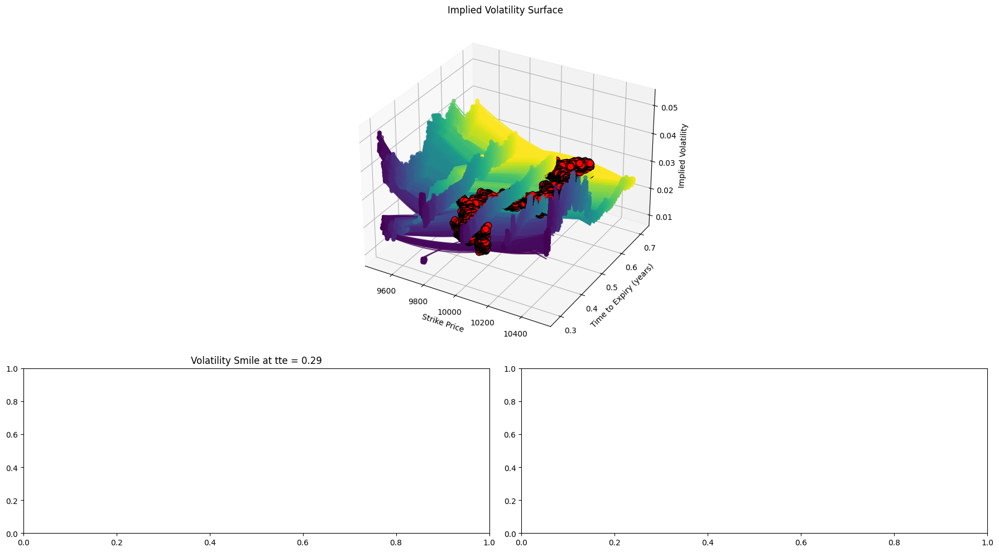

MovieWriter ffmpeg unavailable; using Pillow instead.


IndexError: list index out of range

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.animation import FuncAnimation
from scipy.optimize import curve_fit
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D

# Assuming result_df is already given with columns:
# - v: implied volatility values for call options
# - S: underlying price
# - strike: strike prices
# - tte_part: time to expiry in years (from ~0.8 to ~0.1)

def plot_implied_vol_surface(result_df):
    # Ensure we have all required columns
    required_cols = ['v', 'S', 'K', 'tte_part']
    for col in required_cols:
        if col not in result_df.columns:
            raise ValueError(f"Missing required column: {col}")
    
    # Define the quadratic function for volatility smile fitting
    def quad_func(x, a, b, c):
        return a * (x**2) + b * x + c
    
    # Get unique values of time to expiry
    unique_ttes = sorted(result_df['tte_part'].unique())
    
    # Create figure with subplots
    fig = plt.figure(figsize=(18, 10))
    gs = gridspec.GridSpec(2, 2, height_ratios=[2, 1])
    
    # 3D surface plot
    ax1 = fig.add_subplot(gs[0, :], projection='3d')
    
    # 2D vol smile plot for specific expiry
    ax2 = fig.add_subplot(gs[1, 0])
    
    # 2D term structure plot for specific strike
    ax3 = fig.add_subplot(gs[1, 1])
    
    # Create a colormap for different tte values
    colors = cm.viridis(np.linspace(0, 1, len(unique_ttes)))
    
    # Plot the 3D surface
    strike_mesh = []
    tte_mesh = []
    vol_mesh = []
    
    for i, tte in enumerate(unique_ttes):
        tte_data = result_df[result_df['tte_part'] == tte]
        strikes = tte_data['K'].values
        ivs = tte_data['v'].values
        
        # Add to mesh data for 3D surface
        for s, iv in zip(strikes, ivs):
            strike_mesh.append(s)
            tte_mesh.append(tte)
            vol_mesh.append(iv)
            
        # Fit quadratic function
        try:
            # Sort by strike to ensure proper curve fitting
            sorted_indices = np.argsort(strikes)
            sorted_strikes = strikes[sorted_indices]
            sorted_ivs = ivs[sorted_indices]
            
            popt, _ = curve_fit(quad_func, sorted_strikes, sorted_ivs)
            
            # Generate smooth curve using fitted parameters
            fine_strikes = np.linspace(min(strikes), max(strikes), 100)
            smooth_ivs = quad_func(fine_strikes, *popt)
            
            # Add to 3D surface plot
            ax1.scatter(strikes, [tte] * len(strikes), ivs, c=[colors[i]] * len(strikes), 
                        label=f'tte={tte:.2f}' if i % 2 == 0 else "", alpha=0.7)
            ax1.plot(fine_strikes, [tte] * len(fine_strikes), smooth_ivs, color=colors[i], alpha=0.8)
            
            # Highlight underlying price
            underlying = tte_data['S'].iloc[0]  # Use the first underlying price for this tte
            # Interpolate IV at the underlying price
            underlying_iv = quad_func(underlying, *popt)
            ax1.scatter([underlying], [tte], [underlying_iv], color='red', s=80, marker='o', edgecolor='black')
            
        except Exception as e:
            print(f"Error fitting curve for tte={tte}: {e}")
    
    # Set up the 3D surface plot
    ax1.set_xlabel('Strike Price')
    ax1.set_ylabel('Time to Expiry (years)')
    ax1.set_zlabel('Implied Volatility')
    ax1.set_title('Implied Volatility Surface')
    ax1.view_init(elev=30, azim=-60)
    
    # Create 2D volatility smile animation
    # Reference to store line objects
    smile_lines = []
    scatter_points = []
    underlying_point = None
    title_text = ax2.set_title(f'Volatility Smile at tte = {unique_ttes[0]:.2f}')
    
    # Update function for animation
    def update_smile(frame):
        tte = unique_ttes[frame % len(unique_ttes)]
        tte_data = result_df[result_df['tte_part'] == tte]
        
        ax2.clear()
        
        # Update title
        ax2.set_title(f'Volatility Smile at tte = {tte:.2f}')
        ax2.set_xlabel('Strike Price')
        ax2.set_ylabel('Implied Volatility')
        ax2.grid(True, alpha=0.3)
        
        # Plot data points
        strikes = tte_data['K'].values
        ivs = tte_data['v'].values
        underlying = tte_data['S'].iloc[0]
        
        # Sort by strike for proper line
        sorted_indices = np.argsort(strikes)
        sorted_strikes = strikes[sorted_indices]
        sorted_ivs = ivs[sorted_indices]
        
        # Plot scatter points
        ax2.scatter(strikes, ivs, color='blue', alpha=0.7, label='Implied Vol')
        
        # Fit quadratic function
        try:
            popt, _ = curve_fit(quad_func, sorted_strikes, sorted_ivs)
            
            # Generate smooth curve
            fine_strikes = np.linspace(min(strikes), max(strikes), 100)
            smooth_ivs = quad_func(fine_strikes, *popt)
            
            # Plot fitted curve
            ax2.plot(fine_strikes, smooth_ivs, 'r-', label='Quadratic Fit')
            
            # Highlight underlying price
            underlying_iv = quad_func(underlying, *popt)
            ax2.axvline(x=underlying, color='green', linestyle='--', alpha=0.5, label='Underlying Price')
            ax2.scatter([underlying], [underlying_iv], color='red', s=100, marker='x', label='Underlying')
            
            # Update term structure plot
            if frame == 0:
                ax3.clear()
                ax3.set_title('Volatility Term Structure (across different tte)')
                ax3.set_xlabel('Time to Expiry (years)')
                ax3.set_ylabel('Implied Volatility')
                ax3.grid(True, alpha=0.3)
                
                # Extract ATM (or nearest) volatilities for all expiries
                atm_vols = []
                for t in unique_ttes:
                    t_data = result_df[result_df['tte_part'] == t]
                    und_price = t_data['S'].iloc[0]
                    # Find strike closest to underlying
                    closest_strike_idx = np.abs(t_data['K'].values - und_price).argmin()
                    atm_vols.append(t_data['v'].iloc[closest_strike_idx])
                
                ax3.plot(unique_ttes, atm_vols, 'bo-', label='ATM Volatility')
                ax3.legend()
                
        except Exception as e:
            print(f"Error in animation for tte={tte}: {e}")
        
        ax2.legend()
        return []
    
    # Create animation
    ani = FuncAnimation(fig, update_smile, frames=len(unique_ttes), interval=800, blit=False)
    
    plt.tight_layout()
    return fig, ani

# Example of how to use the function (commented out since we assume result_df is given)
# result_df = pd.DataFrame({
#     'strike': [...],
#     'v': [...],
#     'S': [...],
#     'tte_part': [...]
# })
fig, ani = plot_implied_vol_surface(result)
plt.show()

# To save the animation:
ani.save('implied_vol_surface.mp4', writer='ffmpeg', fps=2, dpi=300)

In [5]:
result = result.dropna(subset=['v', 'S', 'K', 'tte_part'])

In [6]:
result_t = result[result['index'] <= 200000]

In [ ]:

def plot_implied_vol_surface_plotly(result_df):
    """
    Create an interactive 2D plot of implied volatility vs strike price using Plotly.
    
    Parameters:
    -----------
    result_df : pandas.DataFrame
        DataFrame containing columns: 'v' (implied vol), 'S' (underlying price),
        'K' (option strike), and 'tte_part' (time to expiry)
    
    Returns:
    --------
    fig : plotly.graph_objects.Figure
        Interactive Plotly figure
    """
    # Ensure we have all required columns
    required_cols = ['v', 'S', 'K', 'tte_part']
    for col in required_cols:
        if col not in result_df.columns:
            raise ValueError(f"Missing required column: {col}")
    
    # Get unique tte_part values sorted
    unique_ttes = sorted(result_df['tte_part'].unique())
    
    # Define the quadratic function for volatility smile fitting
    def quad_func(x, a, b, c):
        return a * (x**2) + b * x + c
    
    # Function to safely perform quadratic fit
    def safe_quad_fit(x, y):
        # Need at least 3 points for quadratic fit
        if len(x) < 3:
            return None, None, None
        
        try:
            # Try quadratic fit
            popt, pcov = curve_fit(quad_func, x, y)
            
            # Calculate R-squared
            residuals = y - quad_func(x, *popt)
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((y - np.mean(y))**2)
            r_squared = 1 - (ss_res / ss_tot)
            
            return popt, r_squared, quad_func
        except Exception as e:
            # Fall back to linear fit if quadratic fails
            try:
                # Define linear function
                def linear_func(x, m, b):
                    return m * x + b
                
                # Try linear fit
                lin_popt, lin_pcov = curve_fit(linear_func, x, y)
                
                # Calculate R-squared for linear fit
                residuals = y - linear_func(x, *lin_popt)
                ss_res = np.sum(residuals**2)
                ss_tot = np.sum((y - np.mean(y))**2)
                r_squared = 1 - (ss_res / ss_tot)
                
                # Convert linear parameters to "quadratic" format with a=0
                popt = [0, lin_popt[0], lin_popt[1]]
                
                return popt, r_squared, linear_func
            except Exception as e2:
                print(f"Both fits failed: Quadratic: {e}, Linear: {e2}")
                return None, None, None
    
    # Create the figure
    fig = go.Figure()
    
    # Dictionary to store fit results for each tte
    fit_results = {}
    
    # Process data for each time to expiry
    for tte in unique_ttes:
        tte_data = result_df[result_df['tte_part'] == tte]
        
        # Get strikes, IVs, and underlying price
        strikes = tte_data['K'].values
        ivs = tte_data['v'].values
        underlying = tte_data['S'].iloc[0]  # First instance of underlying price for this tte
        
        # Skip if not enough data points
        if len(strikes) <= 1:
            print(f"Skipping tte={tte} - not enough data points")
            fit_results[tte] = None
            continue
        
        # Sort by strike for proper curve fitting
        sorted_indices = np.argsort(strikes)
        sorted_strikes = strikes[sorted_indices]
        sorted_ivs = ivs[sorted_indices]
        
        # Safe fitting
        popt, r_squared, fit_func = safe_quad_fit(sorted_strikes, sorted_ivs)
        
        if popt is not None:
            # Generate smooth curve using fitted parameters
            fine_strikes = np.linspace(min(strikes) * 0.95, max(strikes) * 1.05, 100)
            
            if fit_func.__name__ == 'quad_func':
                smooth_ivs = quad_func(fine_strikes, *popt)
                fit_type = "Quadratic"
            else:
                smooth_ivs = fit_func(fine_strikes, popt[1], popt[2])  # Linear fit
                fit_type = "Linear"
            
            # Calculate IV at the underlying price
            if underlying >= min(strikes) and underlying <= max(strikes):
                if fit_func.__name__ == 'quad_func':
                    underlying_iv = quad_func(underlying, *popt)
                else:
                    underlying_iv = fit_func(underlying, popt[1], popt[2])
            else:
                # If underlying is outside the range, use nearest point
                if underlying < min(strikes):
                    underlying_iv = sorted_ivs[0]
                else:
                    underlying_iv = sorted_ivs[-1]
            
            # Store results
            fit_results[tte] = {
                'popt': popt,
                'r_squared': r_squared,
                'underlying': underlying,
                'underlying_iv': underlying_iv,
                'fine_strikes': fine_strikes,
                'smooth_ivs': smooth_ivs,
                'fit_type': fit_type
            }
        else:
            fit_results[tte] = None
            print(f"Could not fit curve for tte={tte}")
        
        # Add scatter trace for option data points
        scatter_opacity = 0.8
        if len(strikes) < 3:  # Make sparse data more visible
            scatter_opacity = 1.0
            
        fig.add_trace(
            go.Scatter(
                x=strikes,
                y=ivs,
                mode='markers',
                name=f'Options (tte={tte:.2f})',
                marker=dict(size=10, opacity=scatter_opacity),
                visible=(tte == unique_ttes[0])  # Only show first tte by default
            )
        )
        
        # Add curve fit line if available
        if fit_results[tte] is not None:
            fig.add_trace(
                go.Scatter(
                    x=fit_results[tte]['fine_strikes'],
                    y=fit_results[tte]['smooth_ivs'],
                    mode='lines',
                    name=f'{fit_results[tte]["fit_type"]} Fit (tte={tte:.2f})',
                    line=dict(color='red', width=2),
                    visible=(tte == unique_ttes[0])  # Only show first tte by default
                )
            )
            
            # Add underlying price point
            fig.add_trace(
                go.Scatter(
                    x=[fit_results[tte]['underlying']],
                    y=[fit_results[tte]['underlying_iv']],
                    mode='markers',
                    name=f'Underlying (tte={tte:.2f})',
                    marker=dict(color='red', size=12, symbol='x'),
                    visible=(tte == unique_ttes[0])  # Only show first tte by default
                )
            )
            
            # Add vertical line at underlying price
            fig.add_trace(
                go.Scatter(
                    x=[fit_results[tte]['underlying'], fit_results[tte]['underlying']],
                    y=[0, max(ivs) * 1.2] if len(ivs) > 0 else [0, 1],
                    mode='lines',
                    name=f'Underlying Price (tte={tte:.2f})',
                    line=dict(color='green', width=1, dash='dash'),
                    visible=(tte == unique_ttes[0])  # Only show first tte by default
                )
            )
        else:
            # Add dummy traces to keep consistent indexing
            for _ in range(3):
                fig.add_trace(
                    go.Scatter(
                        x=[],
                        y=[],
                        mode='markers',
                        showlegend=False,
                        visible=False
                    )
                )
    
    # Create slider steps
    steps = []
    for i, tte in enumerate(unique_ttes):
        step = dict(
            method="update",
            args=[{"visible": [False] * len(fig.data)},
                  {"title": f"Implied Volatility Smile (Time to Expiry = {tte:.2f} years)"}],
            label=f"{tte:.2f}"
        )
        # Show only the traces for this tte (4 traces per tte: scatter, fit line, underlying point, vertical line)
        for j in range(4):
            if i * 4 + j < len(fig.data):
                step["args"][0]["visible"][i * 4 + j] = True
        steps.append(step)
    
    # Add annotations for the first tte (will update with slider)
    first_tte = unique_ttes[0]
    if fit_results[first_tte] is not None:
        popt = fit_results[first_tte]['popt']
        r_squared = fit_results[first_tte]['r_squared']
        underlying = fit_results[first_tte]['underlying']
        fit_type = fit_results[first_tte]['fit_type']
        
        # Create formula text based on fit type
        if fit_type == "Quadratic":
            formula_text = f"{fit_type} fit:<br>y = {popt[0]:.4f}x² + {popt[1]:.4f}x + {popt[2]:.4f}<br>R² = {r_squared:.4f}"
        else:
            formula_text = f"{fit_type} fit:<br>y = {popt[1]:.4f}x + {popt[2]:.4f}<br>R² = {r_squared:.4f}"
        
        # Create annotations
        annotations = [
            dict(
                x=0.02,
                y=0.95,
                xref="paper",
                yref="paper",
                text=formula_text,
                showarrow=False,
                align="left",
                bgcolor="white",
                opacity=0.8
            ),
            dict(
                x=0.02,
                y=0.85,
                xref="paper",
                yref="paper",
                text=f"Underlying Price: ${underlying:.2f}",
                showarrow=False,
                align="left",
                bgcolor="white",
                opacity=0.8
            )
        ]
        fig.update_layout(annotations=annotations)
    
    # Create and add slider
    sliders = [dict(
        active=0,
        currentvalue={"prefix": "Time to Expiry: ", "suffix": " years"},
        pad={"t": 50},
        steps=steps
    )]
    
    # Update figure layout
    fig.update_layout(
        title=f"Implied Volatility Smile (Time to Expiry = {unique_ttes[0]:.2f} years)",
        xaxis_title="Strike Price (K)",
        yaxis_title="Implied Volatility (v)",
        sliders=sliders,
        legend_title="Legend",
        hovermode="closest",
        template="plotly_white"
    )
    
    # Add play button functionality through updatemenus
    play_button = dict(
        type="buttons",
        buttons=[
            dict(
                label="Play",
                method="animate",
                args=[None, {"frame": {"duration": 800, "redraw": True}, "fromcurrent": True}]
            ),
            dict(
                label="Pause",
                method="animate",
                args=[[None], {"frame": {"duration": 0, "redraw": False}, "mode": "immediate"}]
            )
        ],
        direction="left",
        pad={"r": 10, "t": 87},
        showactive=False,
        x=0.1,
        xanchor="right",
        y=0,
        yanchor="top"
    )
    
    # Add frames for animation
    frames = []
    for i, tte in enumerate(unique_ttes):
        frame_data = []
        # Add the 4 traces for this tte
        for j in range(4):
            if i * 4 + j < len(fig.data):
                frame_data.append(fig.data[i * 4 + j])
        
        # Update annotations for this frame
        frame_annotations = []
        if fit_results[tte] is not None:
            popt = fit_results[tte]['popt']
            r_squared = fit_results[tte]['r_squared']
            underlying = fit_results[tte]['underlying']
            fit_type = fit_results[tte]['fit_type']
            
            # Create formula text based on fit type
            if fit_type == "Quadratic":
                formula_text = f"{fit_type} fit:<br>y = {popt[0]:.4f}x² + {popt[1]:.4f}x + {popt[2]:.4f}<br>R² = {r_squared:.4f}"
            else:
                formula_text = f"{fit_type} fit:<br>y = {popt[1]:.4f}x + {popt[2]:.4f}<br>R² = {r_squared:.4f}"
            
            frame_annotations = [
                dict(
                    x=0.02,
                    y=0.95,
                    xref="paper",
                    yref="paper",
                    text=formula_text,
                    showarrow=False,
                    align="left",
                    bgcolor="white",
                    opacity=0.8
                ),
                dict(
                    x=0.02,
                    y=0.85,
                    xref="paper",
                    yref="paper",
                    text=f"Underlying Price: ${underlying:.2f}",
                    showarrow=False,
                    align="left",
                    bgcolor="white",
                    opacity=0.8
                )
            ]
        
        frames.append(
            go.Frame(
                data=frame_data,
                name=f"frame_{i}",
                layout=go.Layout(
                    title=f"Implied Volatility Smile (Time to Expiry = {tte:.2f} years)",
                    annotations=frame_annotations
                )
            )
        )
    
    fig.frames = frames
    fig.update_layout(updatemenus=[play_button])
    
    return fig

# Example of how to use the function:
# result_df = pd.DataFrame({
#     'K': [...],
#     'v': [...],
#     'S': [...],
#     'tte_part': [...]
# })
fig = plot_implied_vol_surface_plotly(result_t)
fig.show()

Skipping tte=0.5238142857142857 - not enough data points
Skipping tte=0.5906857142857143 - not enough data points
Skipping tte=0.6038 - not enough data points
Skipping tte=0.6054285714285714 - not enough data points
Skipping tte=0.6244142857142857 - not enough data points
Skipping tte=0.6267857142857143 - not enough data points
Skipping tte=0.6456142857142857 - not enough data points
Skipping tte=0.6595714285714286 - not enough data points
Skipping tte=0.6611 - not enough data points
Skipping tte=0.6630428571428572 - not enough data points
Skipping tte=0.6668428571428572 - not enough data points
Skipping tte=0.6689285714285714 - not enough data points
Skipping tte=0.6799714285714286 - not enough data points
Skipping tte=0.6801 - not enough data points
Skipping tte=0.6947571428571429 - not enough data points
Skipping tte=0.6952571428571429 - not enough data points
Skipping tte=0.6980571428571428 - not enough data points
Skipping tte=0.6982857142857143 - not enough data points


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x110e0b170>>
Traceback (most recent call last):
  File "/Users/andaks/Library/Python/3.12/lib/python/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


In [ ]:
#result.to_csv('data_volc_options.csv', index=False)

In [110]:
import numpy as np
df = result
df = df.sort_values(by=['product', 'day', 'timestamp'])
df['log_returns'] = np.log(df['S']) - np.log(df['S'].shift(1))
df['log_returns'][df['timestamp'] == 0] = np.nan
df['std'] = (
    df.groupby('product')['log_returns']
    .expanding(min_periods=2)
    .std()
    .reset_index(level=0, drop=True)  # flatten the MultiIndex
)
df['rel_vol'] = df['std'] / np.sqrt(df.groupby('product')['tte_part'].transform('max') - df['tte_part'])
df

/var/folders/gh/dfjmmnfn63s_k8hfzrv1t9m40000gn/T/ipykernel_8192/2045797091.py:5: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/var/folders/gh/dfjmmnfn63s_k8hfzrv1t9m40000gn/T/ipykernel_8192/2045797091.py:5: SettingWithCopyWarning:


A value

,index,day,timestamp,product,bid_price_1,bid_volume_1,bid_price_2,bid_volume_2,bid_price_3,bid_volume_3,...,tte,tte_part,S,K,m_t,v,realized_v,log_returns,std,rel_vol
3,12,2,0,VOLCANIC_ROCK_VOUCHER_10000,233.0,11.0,NaN,NaN,NaN,NaN,...,5000000,0.714286,10218.5,10000,-0.025575,0.023973,NaN,NaN,NaN,NaN
9,29,2,100,VOLCANIC_ROCK_VOUCHER_10000,234.0,19.0,NaN,NaN,NaN,NaN,...,4999900,0.714271,10217.5,10000,-0.025459,0.024911,0.008631,-0.000098,NaN,NaN
11,36,2,200,VOLCANIC_ROCK_VOUCHER_10000,235.0,15.0,NaN,NaN,NaN,NaN,...,4999800,0.714257,10222.0,10000,-0.025981,0.023431,0.025977,0.000440,0.000381,0.071196
18,55,2,300,VOLCANIC_ROCK_VOUCHER_10000,235.0,16.0,NaN,NaN,NaN,NaN,...,4999700,0.714243,10223.0,10000,-0.026097,0.022951,0.016662,0.000098,0.000272,0.041612
21,66,2,400,VOLCANIC_ROCK_VOUCHER_10000,234.0,16.0,NaN,NaN,NaN,NaN,...,4999600,0.714229,10217.0,10000,-0.025402,0.025121,0.022070,-0.000587,0.000429,0.056761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149978,449935,4,999500,VOLCANIC_ROCK_VOUCHER_9750,356.0,15.0,NaN,NaN,NaN,NaN,...,2000500,0.285786,10105.0,9750,-0.066898,0.033425,NaN,-0.000495,0.000232,0.000354
149981,449942,4,999600,VOLCANIC_ROCK_VOUCHER_9750,356.0,14.0,NaN,NaN,NaN,NaN,...,2000400,0.285771,10106.0,9750,-0.067085,0.028704,NaN,0.000099,0.000232,0.000354
149985,449958,4,999700,VOLCANIC_ROCK_VOUCHER_9750,357.0,16.0,NaN,NaN,NaN,NaN,...,2000300,0.285757,10106.5,9750,-0.067179,0.031557,NaN,0.000049,0.000232,0.000354
149994,449982,4,999800,VOLCANIC_ROCK_VOUCHER_9750,355.0,22.0,NaN,NaN,NaN,NaN,...,2000200,0.285743,10105.0,9750,-0.066903,0.028637,NaN,-0.000148,0.000232,0.000354
